In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [2]:
data = pd.read_csv('us_gov_oth_gov.csv')               ## Only US Government vs Others Government
#data = pd.read_csv('us_gov_oth_bus.csv')              ## Only US Government vs Others Business
#data = pd.read_csv('us_bus_oth_gov.csv')              ## Only US Business vs Others Government
#data = pd.read_csv('us_bus_oth_bus.csv')              ## Only US Business vs Others Business
#data = pd.read_csv('overall_data.csv')                ## All government and business data

In [3]:
df = pd.DataFrame(data)
df

,Date,TargetCountry,TargetCountryCode,ReceivingCountry,ReceivingCountryCode,Action,NumArticles,AvgTone,AvgGoldsteinScale,Action Name
0,20160101,USA,GOV,FIN,GOV,40,10,1.762115,1.0,"Consult, not specified below"
1,20160101,USA,GOV,FRA,GOV,10,6,-1.574803,0.0,"Make statement, not specified below"
2,20160101,USA,GOV,FRA,GOV,14,6,-1.980198,0.0,Consider policy option
3,20160101,USA,GOV,FRA,GOV,40,1,-0.847458,1.0,"Consult, not specified below"
4,20160101,USA,GOV,DEU,GOV,10,6,0.000000,0.0,"Make statement, not specified below"
...,...,...,...,...,...,...,...,...,...,...
118002,20240528,USA,GOV,ISR,GOV,46,8,-0.584795,7.0,Engage in negotiation
118003,20240528,USA,GOV,ESP,GOV,180,2,-0.196078,-9.0,"Use unconventional violence, not specified below"
118004,20240528,USA,GOV,GBR,GOV,46,10,1.562500,7.0,Engage in negotiation
118005,20240528,USA,GOV,EGY,GOV,70,1,-6.031128,7.0,"Provide aid, not specified below"


In [4]:
#df['Date'].dtype
df['Date'] = pd.to_datetime(data['Date'], format='%Y%m%d')
df['Date'].dtype

dtype('<M8[ns]')

In [5]:
df['YearMonth'] = df['Date'].dt.to_period('M')

In [6]:
df

,Date,TargetCountry,TargetCountryCode,ReceivingCountry,ReceivingCountryCode,Action,NumArticles,AvgTone,AvgGoldsteinScale,Action Name,YearMonth
0,2016-01-01,USA,GOV,FIN,GOV,40,10,1.762115,1.0,"Consult, not specified below",2016-01
1,2016-01-01,USA,GOV,FRA,GOV,10,6,-1.574803,0.0,"Make statement, not specified below",2016-01
2,2016-01-01,USA,GOV,FRA,GOV,14,6,-1.980198,0.0,Consider policy option,2016-01
3,2016-01-01,USA,GOV,FRA,GOV,40,1,-0.847458,1.0,"Consult, not specified below",2016-01
4,2016-01-01,USA,GOV,DEU,GOV,10,6,0.000000,0.0,"Make statement, not specified below",2016-01
...,...,...,...,...,...,...,...,...,...,...,...
118002,2024-05-28,USA,GOV,ISR,GOV,46,8,-0.584795,7.0,Engage in negotiation,2024-05
118003,2024-05-28,USA,GOV,ESP,GOV,180,2,-0.196078,-9.0,"Use unconventional violence, not specified below",2024-05
118004,2024-05-28,USA,GOV,GBR,GOV,46,10,1.562500,7.0,Engage in negotiation,2024-05
118005,2024-05-28,USA,GOV,EGY,GOV,70,1,-6.031128,7.0,"Provide aid, not specified below",2024-05


In [7]:
def weighted_avg(df, values, weights):
    return (df[values] * df[weights]).sum() / df[weights].sum()

# Static Top Countries and Actions

In [8]:
country_monthly = df.groupby(['YearMonth', 'ReceivingCountry']).agg(
    TotalArticleCount=('NumArticles', 'sum'),
    TotalActionCount=('Action', 'count'),
    AvgSentiment=('AvgTone', 'mean'),
    Wei_AvgTone=('AvgTone', lambda x: weighted_avg(df.loc[x.index], 'AvgTone', 'NumArticles'))
).reset_index()

In [9]:
country_monthly

,YearMonth,ReceivingCountry,TotalArticleCount,TotalActionCount,AvgSentiment,Wei_AvgTone
0,2016-01,ARE,8,3,-0.904435,-1.114373
1,2016-01,AUS,675,58,-0.366334,-0.329528
2,2016-01,AUT,103,12,-2.157536,-2.648935
3,2016-01,BEL,46,5,1.662885,2.127081
4,2016-01,BRA,249,15,-4.107405,-4.480581
...,...,...,...,...,...,...
4398,2024-05,SWE,17,2,-0.792056,0.011141
4399,2024-05,THA,4,1,0.321543,0.321543
4400,2024-05,TUR,89,18,-0.493784,-0.265072
4401,2024-05,TWN,44,9,-1.149100,-0.733174


In [10]:
#country_monthly.to_csv('monthly.csv')

In [42]:
action_monthly = df.groupby(['YearMonth', 'Action Name']).agg(
    TotalActionCount=('Action', 'count'),
    AvgSentiment=('AvgTone', 'mean'),
    Wei_AvgTone=('AvgTone', lambda x: weighted_avg(df.loc[x.index], 'AvgTone', 'NumArticles'))
).reset_index()

In [43]:
action_monthly

,YearMonth,Action Name,TotalActionCount,AvgSentiment,Wei_AvgTone
0,2016-01,"Abduct, hijack, or take hostage",4,-1.808769,-2.541328
1,2016-01,Accede to demands for change in leadership,2,-0.522058,-0.126631
2,2016-01,Accede to demands for rights,1,0.456621,0.456621
3,2016-01,Acknowledge or claim responsibility,2,-0.209607,1.419925
4,2016-01,Apologize,5,-3.037239,-2.574828
...,...,...,...,...,...
7572,2024-05,Threaten with repression,2,-9.731631,-9.718056
7573,2024-05,"Threaten with sanctions, boycott, embargo",1,-0.574713,-0.574713
7574,2024-05,"Use unconventional violence, not specified below",7,-5.068570,-4.979461
7575,2024-05,Veto,1,-2.647975,-2.647975


In [44]:
top_countries = country_monthly.groupby('ReceivingCountry')['TotalActionCount'].sum().nlargest(10).index
print('Top 10 Countries:',top_countries.tolist())

Top 10 Countries: ['ISR', 'CHN', 'GBR', 'MEX', 'DEU', 'FRA', 'CAN', 'IND', 'JPN', 'SAU']


In [45]:
top_actions = action_monthly.groupby('Action Name')['TotalActionCount'].sum().nlargest(5).index
print('Top 5 Actions:', top_actions.tolist())

Top 5 Actions: ['Consult, not specified below', 'Engage in negotiation', 'Express intent to meet or negotiate', 'Make statement, not specified below', 'Host a visit']


In [46]:
#df.set_index('Date', inplace=True)
df

,Date,TargetCountry,TargetCountryCode,ReceivingCountry,ReceivingCountryCode,Action,NumArticles,AvgTone,AvgGoldsteinScale,Action Name,YearMonth
0,2016-01-01,USA,GOV,FIN,GOV,40,10,1.762115,1.0,"Consult, not specified below",2016-01
1,2016-01-01,USA,GOV,FRA,GOV,10,6,-1.574803,0.0,"Make statement, not specified below",2016-01
2,2016-01-01,USA,GOV,FRA,GOV,14,6,-1.980198,0.0,Consider policy option,2016-01
3,2016-01-01,USA,GOV,FRA,GOV,40,1,-0.847458,1.0,"Consult, not specified below",2016-01
4,2016-01-01,USA,GOV,DEU,GOV,10,6,0.000000,0.0,"Make statement, not specified below",2016-01
...,...,...,...,...,...,...,...,...,...,...,...
118002,2024-05-28,USA,GOV,ISR,GOV,46,8,-0.584795,7.0,Engage in negotiation,2024-05
118003,2024-05-28,USA,GOV,ESP,GOV,180,2,-0.196078,-9.0,"Use unconventional violence, not specified below",2024-05
118004,2024-05-28,USA,GOV,GBR,GOV,46,10,1.562500,7.0,Engage in negotiation,2024-05
118005,2024-05-28,USA,GOV,EGY,GOV,70,1,-6.031128,7.0,"Provide aid, not specified below",2024-05


In [16]:
country_monthly_top = country_monthly[country_monthly['ReceivingCountry'].isin(top_countries)]
country_monthly_top

,YearMonth,ReceivingCountry,TotalArticleCount,TotalActionCount,AvgSentiment,Wei_AvgTone
5,2016-01,CAN,472,63,-0.289748,-0.325154
8,2016-01,CHN,965,108,-1.025813,-0.960763
11,2016-01,DEU,808,69,-0.599178,-1.142608
16,2016-01,FRA,534,86,-2.037365,-2.113029
17,2016-01,GBR,791,91,-2.014895,-1.436137
...,...,...,...,...,...,...
4384,2024-05,IND,123,20,-1.058010,-0.899189
4386,2024-05,ISR,2318,242,-3.605541,-3.695109
4388,2024-05,JPN,251,37,-1.024678,-0.937511
4390,2024-05,MEX,167,24,-2.672083,-3.745710


In [17]:
country_monthly_top[country_monthly_top['ReceivingCountry']=='SAU']

,YearMonth,ReceivingCountry,TotalArticleCount,TotalActionCount,AvgSentiment,Wei_AvgTone
38,2016-01,SAU,648,78,-3.303672,-3.122833
84,2016-02,SAU,511,66,-1.430362,-1.969674
128,2016-03,SAU,563,70,-1.945062,-1.908020
174,2016-04,SAU,3879,226,-2.282106,-2.110478
219,2016-05,SAU,772,68,-2.033905,-1.869354
...,...,...,...,...,...,...
4231,2024-01,SAU,121,14,-3.099694,-2.220023
4272,2024-02,SAU,261,47,-2.681412,-2.035130
4316,2024-03,SAU,98,13,-3.476930,-3.334865
4357,2024-04,SAU,101,15,-1.677491,-1.610389


In [47]:
action_monthly_top = action_monthly[action_monthly['Action Name'].isin(top_actions)]
action_monthly_top

,YearMonth,Action Name,TotalActionCount,AvgSentiment,Wei_AvgTone
17,2016-01,"Consult, not specified below",229,-1.361562,-1.683475
34,2016-01,Engage in negotiation,102,-0.904539,-0.824791
41,2016-01,Express intent to meet or negotiate,127,-0.919510,-1.045859
49,2016-01,Host a visit,74,-0.559891,-0.223992
59,2016-01,"Make statement, not specified below",101,-2.024813,-1.964287
...,...,...,...,...,...
7519,2024-05,"Consult, not specified below",118,-1.391022,-2.531202
7532,2024-05,Engage in negotiation,56,-1.441437,-1.952580
7539,2024-05,Express intent to meet or negotiate,37,-1.168948,-1.556594
7545,2024-05,Host a visit,49,-0.415671,-0.917408


In [48]:
action_monthly_top[action_monthly_top['Action Name']=='Consult, not specified below']

,YearMonth,Action Name,TotalActionCount,AvgSentiment,Wei_AvgTone
17,2016-01,"Consult, not specified below",229,-1.361562,-1.683475
103,2016-02,"Consult, not specified below",253,-1.358277,-1.501453
193,2016-03,"Consult, not specified below",247,-1.355769,-1.579523
280,2016-04,"Consult, not specified below",279,-0.964616,-1.205549
377,2016-05,"Consult, not specified below",238,-0.943268,-1.449974
...,...,...,...,...,...
7230,2024-01,"Consult, not specified below",156,-1.606351,-1.613059
7297,2024-02,"Consult, not specified below",143,-1.417373,-1.791654
7375,2024-03,"Consult, not specified below",171,-0.340575,-1.066168
7443,2024-04,"Consult, not specified below",171,-1.283587,-1.890338


## Top 10 Country - Monthly Time Series

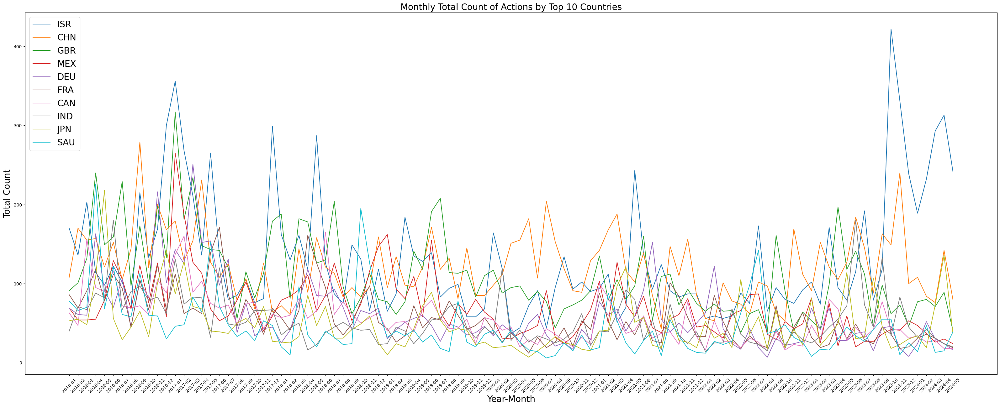

In [49]:
fig, ax = plt.subplots(figsize=(40, 15))

# Country Action
for country in top_countries:
    subset = country_monthly_top[country_monthly_top['ReceivingCountry'] == country]
    ax.plot(subset['YearMonth'].astype(str), subset['TotalActionCount'], label= f'{country}')

ax.set_title('Monthly Total Count of Actions by Top 10 Countries',fontsize=20)
plt.xlabel('Year-Month',fontsize=20)
ax.set_ylabel('Total Count',fontsize=20)
ax.legend(fontsize=20)
plt.xticks(rotation=45)
plt.show()

# This plot shows the monthly count of actions taken by top 10 country government towards US.

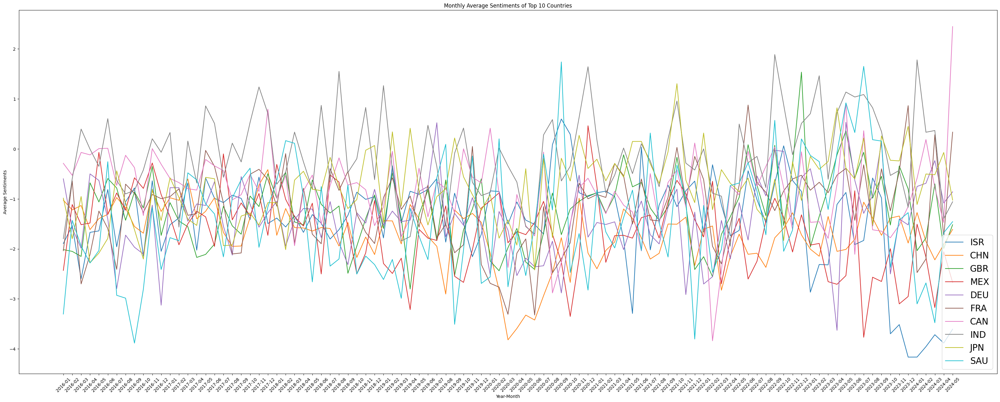

In [21]:
fig, ax = plt.subplots(figsize=(40, 15))

# Country Average Sentiment
for country in top_countries:
    subset = country_monthly_top[country_monthly_top['ReceivingCountry'] == country]
    ax.plot(subset['YearMonth'].astype(str), subset['AvgSentiment'], label=f'{country}')

ax.set_title('Monthly Average Sentiments of Top 10 Countries')
ax.set_ylabel('Average Sentiments')
plt.xlabel('Year-Month')
ax.legend(fontsize=20, loc='lower right')
plt.xticks(rotation=45)
plt.show()

# This plot shows the monthly average sentiment of actions taken by top 10 country government towards US.

## Top 5 Action - Monthly Time Series

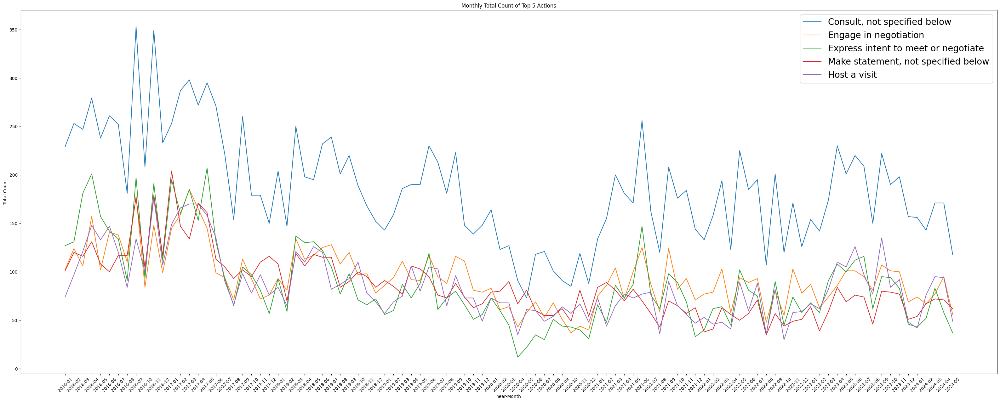

In [50]:
fig, ax = plt.subplots(figsize=(40, 15))

# Action Count
for action in top_actions:
    subset = action_monthly_top[action_monthly_top['Action Name'] == action]
    ax.plot(subset['YearMonth'].astype(str), subset['TotalActionCount'], label=f'{action}')

ax.set_title('Monthly Total Count of Top 5 Actions')
ax.set_ylabel('Total Count')
ax.legend(fontsize=20)
plt.xlabel('Year-Month')
plt.xticks(rotation=45)
plt.show()


# The plot shows the monthly count of top actions towards US goverment by other governments

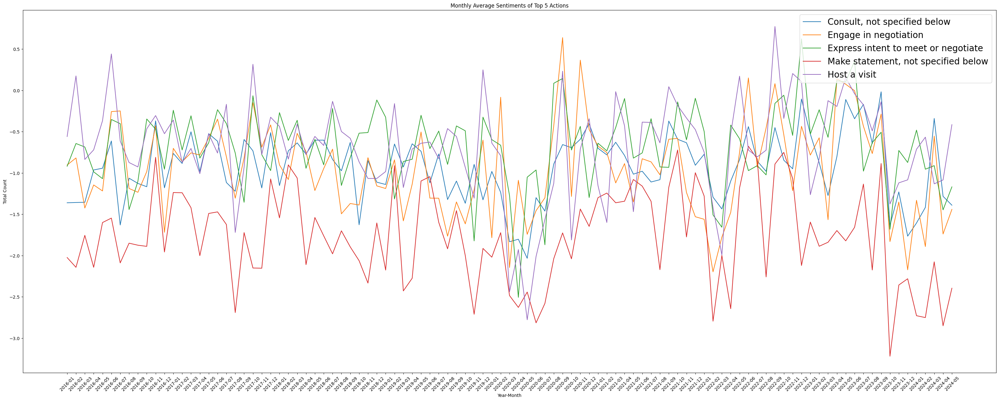

In [51]:
fig, ax = plt.subplots(figsize=(40, 15))

# Action Sentiment
for action in top_actions:
    subset = action_monthly_top[action_monthly_top['Action Name'] == action]
    ax.plot(subset['YearMonth'].astype(str), subset['AvgSentiment'], label=f'{action}')

ax.set_title('Monthly Average Sentiments of Top 5 Actions')
ax.set_ylabel('Total Count')
ax.legend(fontsize=20, loc = 'upper right')
plt.xlabel('Year-Month')
plt.xticks(rotation=45)
plt.show()


# The plot shows the monthly average sentiment of top actions towards US goverment by other governments

# Dynamic Top Countries and Actions

In [55]:
top_country_actiontrends = pd.DataFrame()
top_country_sentitrends = pd.DataFrame()
top_action_actiontrends = pd.DataFrame()
top_action_sentitrends = pd.DataFrame()

In [56]:
for period in data['YearMonth'].unique():
    # Action count of top 10 countries for the current month
    top_countries = country_monthly[country_monthly['YearMonth'] == period].nlargest(10, 'TotalActionCount')
    top_countries['YearMonth'] = period
    top_country_actiontrends = pd.concat([top_country_actiontrends, top_countries])
    
    # Average sentiment of top 10 countries for the current month
    top_senticountries = country_monthly[country_monthly['YearMonth'] == period].nlargest(10, 'AvgSentiment')
    top_senticountries['YearMonth'] = period
    top_country_sentitrends = pd.concat([top_country_sentitrends, top_senticountries])
    
    # Get the top actions for the current month
    top_actions = action_monthly[action_monthly['YearMonth'] == period].nlargest(5, 'TotalActionCount')
    top_actions['YearMonth'] = period
    top_action_actiontrends = pd.concat([top_action_actiontrends, top_actions])
    
    # Get the top actions for the current month
    top_sentiactions = action_monthly[action_monthly['YearMonth'] == period].nlargest(5, 'TotalActionCount')
    top_sentiactions['YearMonth'] = period
    top_action_sentitrends = pd.concat([top_action_sentitrends, top_sentiactions])    

In [57]:
top_country_actiontrends[top_country_actiontrends['YearMonth']=='2024-05']

,YearMonth,ReceivingCountry,TotalArticleCount,TotalActionCount,AvgSentiment,Wei_AvgTone
4386,2024-05,ISR,2318,242,-3.605541,-3.695109
4371,2024-05,CHN,661,80,-1.610183,-1.250850
4379,2024-05,GBR,268,41,-1.517560,-1.648209
4396,2024-05,SAU,285,39,-1.456575,-1.871262
4375,2024-05,EGY,297,37,-2.857270,-2.709020
4388,2024-05,JPN,251,37,-1.024678,-0.937511
4390,2024-05,MEX,167,24,-2.672083,-3.745710
4384,2024-05,IND,123,20,-1.058010,-0.899189
4378,2024-05,FRA,107,19,0.334153,-0.956978
4368,2024-05,CAN,93,18,2.444553,2.407216


### Monthly Total Count of Actions by Dynamic Top 10 Countries

In [58]:
#top_country_actiontrends[top_country_actiontrends['YearMonth']=='2024-05']
country_actionpivot = top_country_actiontrends.pivot_table(index='YearMonth', columns='ReceivingCountry', values='TotalActionCount', fill_value=0)
country_actionpivot

ReceivingCountry,ARE,AUS,BEL,BRA,CAN,CHE,CHL,CHN,COL,DEU,...,NOR,PER,PHL,POL,SAU,SGP,SWE,TUR,TWN,ZAF
YearMonth,,,,,,,,,,,,,,,,,,,,,
2016-01,0,58,0,0,63,0,0,108,0,69,...,0,0,0,0,78,0,0,82,0,0
2016-02,0,0,0,0,0,0,0,170,60,61,...,0,0,0,0,66,0,0,115,0,0
2016-03,0,0,102,0,156,0,0,155,0,60,...,0,0,0,0,70,0,0,98,0,0
2016-04,0,0,0,0,95,0,0,157,0,163,...,0,0,0,0,226,0,0,97,0,0
2016-05,0,0,0,0,90,0,0,121,0,91,...,0,0,0,0,68,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-01,0,0,0,0,34,0,0,108,0,24,...,0,0,0,0,0,0,0,0,24,0
2024-02,0,0,0,0,26,0,0,84,0,52,...,0,0,0,0,47,0,0,0,0,0
2024-03,0,0,0,0,0,0,0,76,0,30,...,0,0,0,0,0,0,0,0,0,0


In [59]:
# Replace 0 values with NaN
country_actionpivot.replace(0, np.nan, inplace=True)

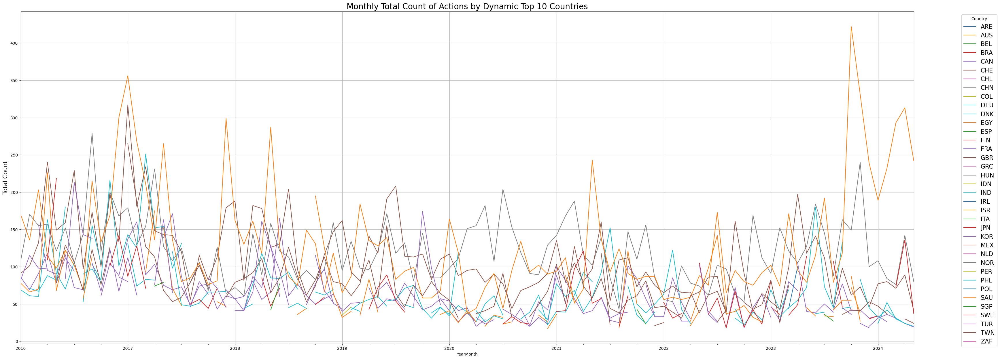

In [60]:
fig, ax = plt.subplots(figsize=(40, 15))
country_actionpivot.plot(ax=ax)
ax.set_title('Monthly Total Count of Actions by Dynamic Top 10 Countries',fontsize = 20)
ax.set_ylabel('Total Count',fontsize = 15)
ax.legend(title='Country', fontsize = 15, bbox_to_anchor=(1.05, 1), loc='upper left')
ax.grid(True)

# This plot shows the monthly count of actions taken by dynamic top 10 country government towards US.

### Monthly Average Sentiments by Dynamic Top 10 Countries

In [61]:
country_sentipivot = top_country_sentitrends.pivot_table(index='YearMonth', columns='ReceivingCountry', values='AvgSentiment', fill_value=0)
country_sentipivot

ReceivingCountry,ARE,AUS,AUT,BEL,BRA,CAN,CHE,CHL,COL,CZE,...,POL,PRT,QAT,SAU,SGP,SWE,THA,TUR,TWN,ZAF
YearMonth,,,,,,,,,,,,,,,,,,,,,
2016-01,0.000000,0.0,0.000000,1.662885,0.00000,0.000000,0.0,-0.181696,0.703297,0.000000,...,0.679138,0.000000,0.0,0.0,1.711455,0.316531,0.0,0.0,0.000000,0.000000
2016-02,2.093856,0.0,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.0,0.992156,0.000000,0.0,0.0,0.000000,0.000000
2016-03,1.943770,0.0,0.000000,0.000000,0.00000,0.000000,0.0,0.487279,0.000000,0.000000,...,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,1.413176,0.000000
2016-04,0.267219,0.0,0.000000,0.000000,0.00000,0.000000,0.0,-0.032270,0.000000,0.000000,...,0.000000,2.844798,0.0,0.0,1.293893,0.000000,0.0,0.0,0.000000,0.000000
2016-05,0.000000,0.0,0.000000,0.000000,0.00000,0.000000,0.0,0.927520,0.000000,0.000000,...,0.000000,0.000000,0.0,0.0,0.416437,0.000000,0.0,0.0,1.061602,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-01,1.694240,0.0,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,...,1.738378,1.449275,0.0,0.0,1.500262,1.410955,0.0,0.0,0.000000,0.000000
2024-02,0.000000,0.0,2.299140,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,1.834092,...,0.000000,0.000000,0.0,0.0,0.000000,3.586419,0.0,0.0,0.000000,2.150538
2024-03,1.690141,0.0,0.908137,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,3.157663,...,0.000000,1.819356,0.0,0.0,0.000000,1.200043,0.0,0.0,0.000000,0.000000


In [62]:
country_sentipivot.replace(0, np.nan, inplace=True)

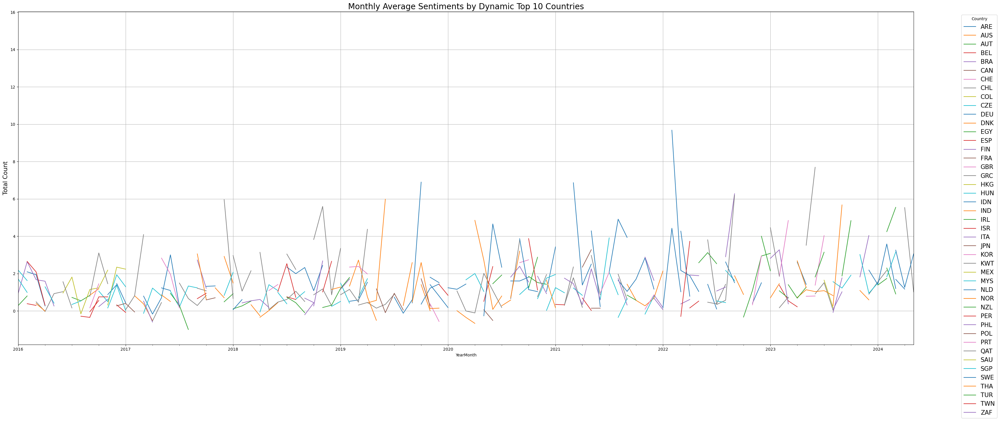

In [63]:
fig, ax = plt.subplots(figsize=(40, 15))
country_sentipivot.plot(ax=ax)
ax.set_title('Monthly Average Sentiments by Dynamic Top 10 Countries',fontsize = 20)
ax.set_ylabel('Total Count',fontsize = 15)
ax.legend(title='Country', fontsize = 15,bbox_to_anchor=(1.05, 1), loc='upper left')
ax.grid(True)

# This plot shows the monthly average sentiments by dynamic top 10 countries government towards US.

### Monthly Total Count of Actions by Dynamic Top 5 Actions

In [65]:
action_pivot = top_action_actiontrends.pivot_table(index='YearMonth', columns='Action Name', values='TotalActionCount', fill_value=0)
action_pivot

Action Name,"Consult, not specified below",Engage in negotiation,Express intent to meet or negotiate,Host a visit,Make a visit,"Make an appeal or request, not specified below","Make statement, not specified below",Praise or endorse
YearMonth,,,,,,,,
2016-01,229,102,127,0,0,0,101,119
2016-02,253,124,131,0,107,0,120,0
2016-03,247,0,181,121,123,0,0,128
2016-04,279,157,201,0,160,0,0,150
2016-05,238,0,157,133,140,0,0,122
...,...,...,...,...,...,...,...,...
2024-01,156,74,0,0,54,0,54,70
2024-02,143,67,0,76,74,0,67,0
2024-03,171,77,83,95,0,0,0,87


In [66]:
action_pivot.replace(0, np.nan, inplace=True)

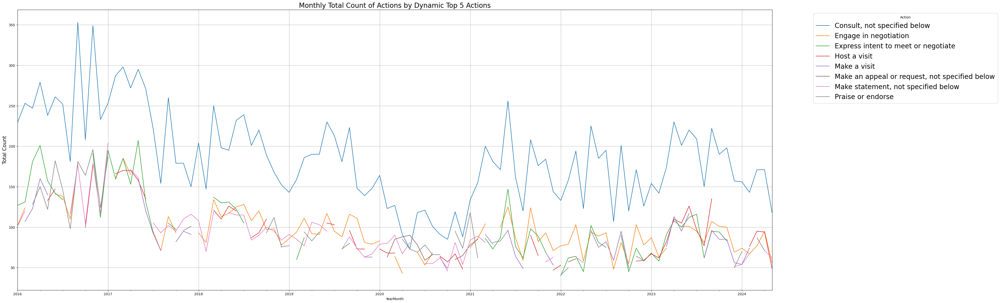

In [67]:
fig, ax = plt.subplots(figsize=(40, 15))
action_pivot.plot(ax=ax)
ax.set_title('Monthly Total Count of Actions by Dynamic Top 5 Actions',fontsize = 20)
ax.set_ylabel('Total Count',fontsize = 15)
ax.legend(title='Action', fontsize = 20, bbox_to_anchor=(1.05, 1), loc='upper left')
ax.grid(True)

# This plot shows the monthly total count of actions by dynamic top 10 countries government towards US.

### Monthly Average Sentiments by Dynamic Top 5 Actions

In [69]:
action_sentipivot = top_action_sentitrends.pivot_table(index='YearMonth', columns='Action Name', values='AvgSentiment', fill_value=0)
action_sentipivot

Action Name,"Consult, not specified below",Engage in negotiation,Express intent to meet or negotiate,Host a visit,Make a visit,"Make an appeal or request, not specified below","Make statement, not specified below",Praise or endorse
YearMonth,,,,,,,,
2016-01,-1.361562,-0.904539,-0.919510,0.000000,0.000000,0.0,-2.024813,-0.880217
2016-02,-1.358277,-0.819082,-0.644225,0.000000,-0.518145,0.0,-2.143048,0.000000
2016-03,-1.355769,0.000000,-0.686439,-0.837052,-0.855411,0.0,0.000000,-1.178365
2016-04,-0.964616,-1.145843,-0.986834,0.000000,-0.597445,0.0,0.000000,-1.177214
2016-05,-0.943268,0.000000,-1.069638,-0.368325,-0.757564,0.0,0.000000,-0.015174
...,...,...,...,...,...,...,...,...
2024-01,-1.606351,-1.331713,0.000000,0.000000,-1.971652,0.0,-2.728803,-1.585516
2024-02,-1.417373,-1.891516,0.000000,-0.567515,-0.515579,0.0,-2.751442,0.000000
2024-03,-0.340575,-0.554359,-0.912253,-1.132432,0.000000,0.0,0.000000,-0.279615


In [70]:
action_sentipivot.replace(0, np.nan, inplace=True)

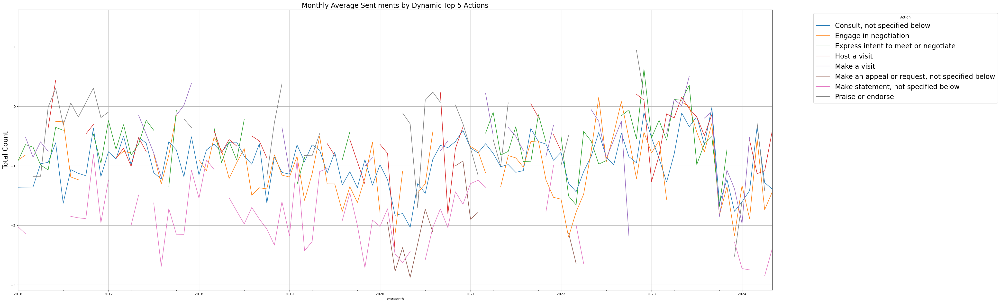

In [71]:
fig, ax = plt.subplots(figsize=(40, 15))
action_sentipivot.plot(ax=ax)
ax.set_title('Monthly Average Sentiments by Dynamic Top 5 Actions',fontsize = 20)
ax.set_ylabel('Total Count',fontsize = 20)
ax.legend(title='Action', fontsize = 20, bbox_to_anchor=(1.05, 1), loc='upper left')
ax.grid(True)

# This plot shows the monthly average sentiments by dynamic top 10 countries government towards US.

## Some Scatter Plots

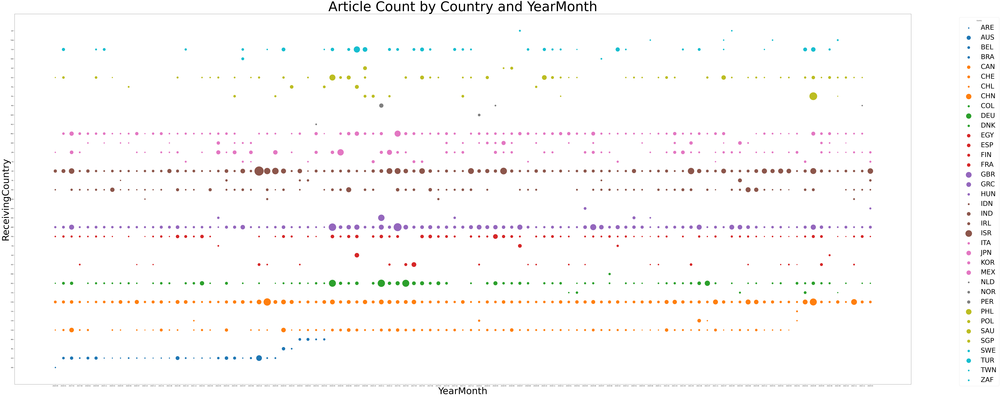

In [72]:
top_country_actiontrends['YearMonth'] = top_country_actiontrends['YearMonth'].astype(str)
grouped = top_country_actiontrends.groupby('ReceivingCountry')
colors = plt.cm.get_cmap('tab10', len(grouped))


plt.figure(figsize=(120, 50))
for idx, (country, country_data) in enumerate(grouped):
    plt.scatter(country_data['YearMonth'], [idx]*len(country_data), s=country_data['TotalArticleCount']*0.5, label=country, color=colors(idx))

plt.yticks(range(len(grouped)), grouped.groups.keys())

plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left',fontsize = 50)
plt.xlabel('YearMonth',fontsize = 70)
plt.ylabel('ReceivingCountry',fontsize = 70)
plt.title('Article Count by Country and YearMonth',fontsize = 100)
plt.show()

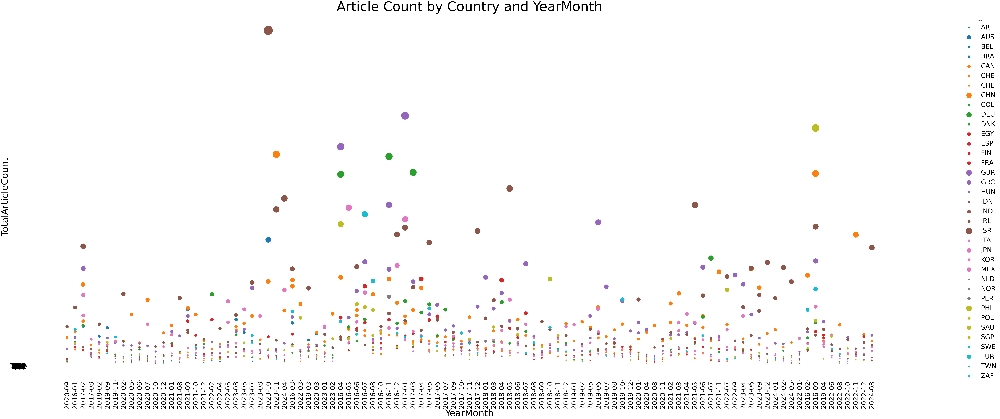

In [73]:
plt.figure(figsize=(120, 50))
for idx, (country, country_data) in enumerate(grouped):
    plt.scatter(country_data['YearMonth'], country_data['TotalArticleCount'], s=country_data['TotalArticleCount']*0.5, label=country, color=colors(idx))

plt.xticks(rotation='vertical', fontsize=50)
plt.yticks(range(len(grouped)), grouped.groups.keys(), fontsize=50)

plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left',fontsize=50)
plt.xlabel('YearMonth', fontsize=70)
plt.ylabel('TotalArticleCount', fontsize=70)
plt.title('Article Count by Country and YearMonth', fontsize=100)
plt.show()


In [74]:
plt.figure(figsize=(120, 100))
for idx, (country, country_data) in enumerate(grouped):
    plt.scatter(country_data['TotalArticleCount'], country_data['YearMonth'], s=country_data['TotalArticleCount']*0.5, label=country, color=colors(idx))

#plt.yticks(rotation='horizontal', fontsize=50)
plt.xticks(range(10), fontsize=50)
plt.xticks(range(len(grouped)), grouped.groups.keys(), fontsize=50)

plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left',fontsize=50)
plt.ylabel('YearMonth', fontsize=70)
plt.xlabel('TotalArticleCount', fontsize=70)
plt.title('Article Count by Country and YearMonth', fontsize=100)
plt.grid(True,axis='x')
plt.show()
